In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from google.colab import drive
import os
import pywt # For wavelet denoising
from google.colab import output
output.disable_custom_widget_manager()
from IPython.display import display

In [ ]:
# mount to google drive to access csv located in my google drive
drive.mount('/content/drive/')
#os.getcwd()
os.chdir('drive/MyDrive/GradSchool/CHEM_269/Act4')

## [EXERCISE 1] Noising and denoising an image

In [ ]:
# define functions to a) load my image and adds gaussian noise

def load_grayscale_image(image_path):
    """Loads a grayscale PNG image and converts it to a NumPy array."""
    img = Image.open(image_path).convert('L')  # 'L' for grayscale
    img_array = np.array(img) / 255.0  # Normalize to [0, 1]
    return img_array

#this is to add gaussian noise one step at a time
def add_gaussian_noise(image, noise_level):
    """Adds Gaussian noise to a grayscale image."""
    noise = np.random.normal(0, noise_level, image.shape)
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Clip values to [0, 1]
    return noisy_image

#this uses the above function to gradually add gaussian noise over multiple steps
def diffusion_process(image_path, num_steps, noise_schedule):
    """Performs a diffusion process on a grayscale image."""
    original_image = load_grayscale_image(image_path)
    noisy_images = [original_image]

    for i in range(num_steps):
        noise_level = noise_schedule[i]
        noisy_image = add_gaussian_noise(noisy_images[-1], noise_level)
        noisy_images.append(noisy_image)

    return noisy_images

def linear_noise_schedule(num_steps, max_noise):
  return np.linspace(0,max_noise, num_steps)



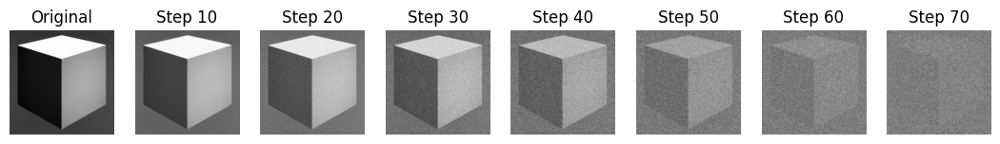

In [ ]:
image_path = "The-Cube_1201.png"

num_steps = 75 # Number of diffusion steps
max_noise = 0.2 # maximum noise level.

noise_schedule = linear_noise_schedule(num_steps, max_noise)
noisy_images = diffusion_process(image_path, num_steps, noise_schedule)

# Display the original and some noisy images:
plt.figure(figsize=(15, 5))
plt.subplot(1, num_steps//10 +2, 1)
plt.imshow(noisy_images[0], cmap='gray')
plt.title('Original')
plt.axis('off')

for i in range(1, num_steps//10 + 1):
  plt.subplot(1, num_steps//10 + 2, i + 1)
  plt.imshow(noisy_images[i*10], cmap='gray')
  plt.title(f'Step {i*10}')
  plt.axis('off')

plt.show()

### Turning a PNG into a pytorch tensor
##### png are basically grids of pixels, which in a grayscale is varying combinations of black and white.
##### First the image is loaded into a numpy array - represents image as multidimensional array of numerical values based on color and intensity of the pixel. In the function above, we normalized the grayscale values to be between 0 and 1. So numpy array would be array of (height,width)
### Tensors
##### tensors are multidimensional arrays of numerical data.
0 dimensional array would be a scalar (single number.
1 dimensional array tensor is a vector.
2 dimensional array is a matrix, etc.
They are designed to be used in graphs for neural network calculations


In [ ]:
#Example of converting to torch tensors for use in a neural net.
noisy_images_torch = [torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0) for img in noisy_images]
print(noisy_images_torch[0].shape) #prints the shape of the first image tensor.

torch.Size([1, 1, 1000, 1000])


In [ ]:
pip install PyWavelets

In [ ]:
#now we want to denoise the image
def wavelet_denoising(image, wavelet='db1', level=1):
    """Applies wavelet denoising to a grayscale image."""
    coeffs = pywt.wavedec2(image, wavelet, level=level)
    coeffs_filtered = list(coeffs) # creates a copy.

    #Thresholding the detail coefficients.
    for i in range(1, len(coeffs)):
        coeffs_filtered[i] = tuple(pywt.threshold(c, value=0.04, mode='soft') for c in coeffs[i])

    denoised_image = pywt.waverec2(coeffs_filtered, wavelet)
    denoised_image = np.clip(denoised_image, 0, 1)
    return denoised_image


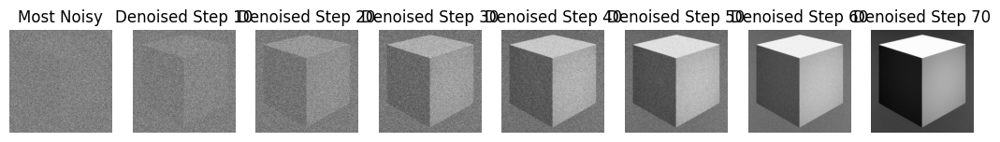

In [ ]:
# Denoising Process:

#initiate empty list for images
denoised_images = []
denoised_images.append(noisy_images_torch[-1].squeeze().numpy()) #add the most noisy image first.
for i in range(len(noisy_images_torch)-2, -1, -1): #loop backwards from the second to last noisy image.
    current_image = noisy_images_torch[i].squeeze().numpy()
    denoised_image = wavelet_denoising(current_image)
    denoised_images.append(denoised_image)

# Display the denoised images:
plt.figure(figsize=(15, 5))
plt.subplot(1, num_steps//10 +2, 1)
plt.imshow(denoised_images[0], cmap='gray')
plt.title('Most Noisy')
plt.axis('off')

for i in range(1, num_steps//10 + 1):
  plt.subplot(1, num_steps//10 + 2, i + 1)
  plt.imshow(denoised_images[i*10], cmap='gray')
  plt.title(f'Denoised Step {i*10}')
  plt.axis('off')

plt.show()

## [EXERCISE 2]
#### Guided noise removal and comparison of ODE vs. SDE outcomes

In [ ]:
def sde_denoising(image, noise_level=0.01):
    """Applies a simple stochastic denoising step."""
    # Simple denoising (e.g., averaging with neighbors)
    denoised_image = image.copy() #from exercise 1
    for i in range(1, image.shape[0] - 1):
        for j in range(1, image.shape[1] - 1):
            denoised_image[i, j] = np.mean(image[i-1:i+2, j-1:j+2])

    # Add small random noise to simulate uncertainty
    stochastic_noise = np.random.normal(0, noise_level, image.shape)
    stochastic_denoised = denoised_image + stochastic_noise
    stochastic_denoised = np.clip(stochastic_denoised, 0, 1)
    return stochastic_denoised


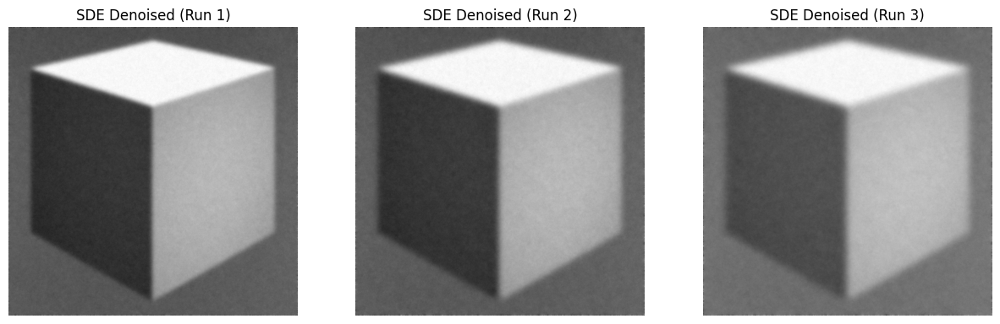

In [ ]:
# SDE-Based Denoising:
num_denoising_steps = len(noisy_images_torch)
final_denoised_images = []

#this uses a local average denoising operation

for _ in range(3): # run the denoising 3 times to show variability.
    denoised_image = gaussian_filter(denoised_image, sigma=1) #sigma controls the amount of blurring.
    for i in range(num_denoising_steps - 2, -1, -1):
        denoised_image = sde_denoising(denoised_image)
    final_denoised_images.append(denoised_image)

# Display the final denoised images:
plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(final_denoised_images[i], cmap='gray')
    plt.title(f'SDE Denoised (Run {i+1})')
    plt.axis('off')

plt.show()


In [ ]:
#also trying a gaussian filter method of denoising
from scipy.ndimage import gaussian_filter
#denoised_image = gaussian_filter(image, sigma=1) #sigma controls the amount of blurring.

In [ ]:
# compare SDE based denoising with ODE-based denoising. The ODE denoising should
# have the same result every time because there is no randomness added in.
def ode_denoising(image, sigma=1):
    """Applies Gaussian smoothing for ODE-based denoising."""
    denoised_image = gaussian_filter(image, sigma=sigma)
    return denoised_image

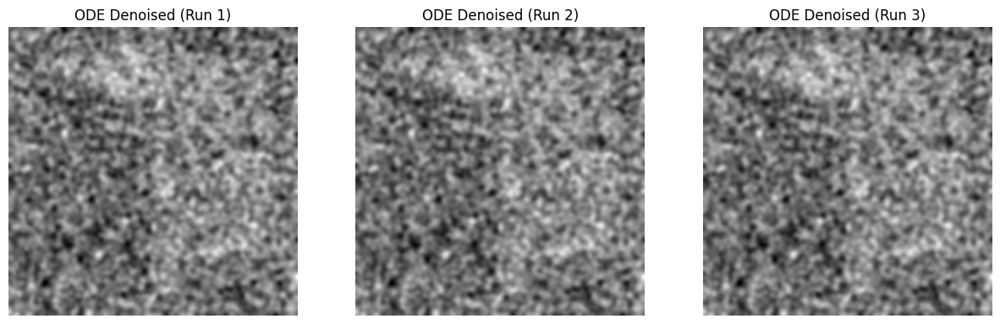

In [ ]:
#ODE-based denoising
image_path = "The-Cube_1201.png"

num_steps = 75 # Number of diffusion steps
max_noise = 0.2 # maximum noise level.

noise_schedule = linear_noise_schedule(num_steps, max_noise)
noisy_images = diffusion_process(image_path, num_steps, noise_schedule)
noisy_images_torch = [torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0) for img in noisy_images]

# ODE-Based Denoising:
num_denoising_steps = len(noisy_images_torch)
final_denoised_images_ode = []

for _ in range(3): # run the denoising 3 times to show determinism.
    denoised_image = noisy_images_torch[-1].squeeze().numpy()
    for i in range(num_denoising_steps - 2, -1, -1):
        denoised_image = ode_denoising(denoised_image)
    final_denoised_images_ode.append(denoised_image)

# Display the final denoised images:
plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(final_denoised_images_ode[i], cmap='gray')
    plt.title(f'ODE Denoised (Run {i+1})')
    plt.axis('off')

plt.show()




### Conclusions:
#### It's clear that the SDE produces different results each run, whereas the ODE results are the same. Also, it looks like the ODE method produces a 'coarser grain' denoising.


# Part Two: Applying Diffusion to protein structures

### [EXERCISE 3] Noising a protein structure

In [ ]:
pip install py3Dmol

In [ ]:
import numpy as np
import requests
from py3Dmol import view as p3dmol_view
from io import StringIO

# ... (same functions as above: load_pdb_from_rcsb, add_coordinate_noise, diffusion_process_pdb, linear_noise_schedule) ...

def load_pdb_from_rcsb(pdb_id):
    """Loads a PDB file from RCSB and returns the PDB string."""
    url = f'https://files.rcsb.org/download/{pdb_id}.pdb'
    response = requests.get(url)
    return response.text

def add_coordinate_noise(pdb_string, noise_level):
    """Adds Gaussian noise to atomic coordinates in a PDB string."""
    lines = pdb_string.splitlines()
    noisy_lines = []
    for line in lines:
        if line.startswith('ATOM') or line.startswith('HETATM'):
            try:
                x = float(line[30:38])
                y = float(line[38:46])
                z = float(line[46:54])

                noise_x = np.random.normal(0, noise_level)
                noise_y = np.random.normal(0, noise_level)
                noise_z = np.random.normal(0, noise_level)

                noisy_x = x + noise_x
                noisy_y = y + noise_y
                noisy_z = z + noise_z

                noisy_line = line[:30] + "{:8.3f}".format(noisy_x) + "{:8.3f}".format(noisy_y) + "{:8.3f}".format(noisy_z) + line[54:]
                noisy_lines.append(noisy_line)
            except ValueError:
                noisy_lines.append(line) #keep original line if cannot parse.
        else:
            noisy_lines.append(line)
    return '\n'.join(noisy_lines)

def diffusion_process_pdb(pdb_id, num_steps, noise_schedule):
    """Performs a diffusion process on a PDB structure."""
    original_pdb = load_pdb_from_rcsb(pdb_id)
    noisy_pdbs = [original_pdb]

    for i in range(num_steps):
        noise_level = noise_schedule[i]
        noisy_pdb = add_coordinate_noise(noisy_pdbs[-1], noise_level)
        noisy_pdbs.append(noisy_pdb)

    return noisy_pdbs

def linear_noise_schedule(num_steps, max_noise):
    return np.linspace(0, max_noise, num_steps)


pdb_id = '7RW6'
num_steps = 20
max_noise = 2.0
noise_schedule = linear_noise_schedule(num_steps, max_noise)
noisy_pdbs = diffusion_process_pdb(pdb_id, num_steps, noise_schedule)

def visualize_pdb_py3dmol(pdb_string, title):
    v = p3dmol_view()
    v.addModel(pdb_string, 'pdb')
    v.setStyle({'cartoon': {'color': 'spectrum'}})
    v.zoomTo()
    print(title)
    v.show()

visualize_pdb_py3dmol(noisy_pdbs[0], "Original Structure")

for i in range(1, num_steps, 5):
    visualize_pdb_py3dmol(noisy_pdbs[i], f"Noisy Structure (Step {i})")

visualize_pdb_py3dmol(noisy_pdbs[-1], "Most Noisy Structure")

Original Structure


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Noisy Structure (Step 1)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Noisy Structure (Step 6)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Noisy Structure (Step 11)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Noisy Structure (Step 16)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Most Noisy Structure


3Dmol.js failed to load for some reason. Please check your browser console for error messages.